In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# **Import Packages**

In [ ]:
  #pip uninstall scipy 


In [ ]:
  #pip install scipy==1.2.2

In [ ]:
from PIL import Image
import scipy.stats
import glob
import numpy as np
from numpy import linalg as la
from pylab import *
import matplotlib.pyplot as plt 
#from ipython_utilities import *
from IPython.display import display, HTML

# **Reading Data**

In [ ]:
image_train_path='/content/gdrive/MyDrive/Eigenfaces_Data/Train/'
image_test_path='/content/gdrive/MyDrive/Eigenfaces_Data/Classify Test/'
image_detect_path='/content/gdrive/MyDrive/Eigenfaces_Data/Detect Test/'
image_non_face_path='/content/gdrive/MyDrive/Eigenfaces_Data/Non-Faces/'
format='.pgm'
format_non_face='.jpg'

In [ ]:
image_train_list=[]
image_test_list=[]
image_detect_list=[]
image_non_face_list=[]
for i in range(1,31):
  im=Image.open(image_train_path+str(i)+format)   
  im= np.asarray(im,dtype=float)/255.0 
  image_train_list.append(im)
  im=Image.open(image_test_path+str(i)+format)   
  im= np.asarray(im,dtype=float)/255.0 
  image_test_list.append(im)
for i in range(31,41):
  im=Image.open(image_detect_path+str(i)+format)   
  im= np.asarray(im,dtype=float)/255.0 
  image_detect_list.append(im)
for i in range(1,4):
  im=Image.open(image_non_face_path+str(i)+format_non_face)   
  im= np.asarray(im,dtype=float)/255.0 
  image_non_face_list.append(im)


# **Plotting Images(Train,Classify Test,Detect Test)**

In [ ]:
# Function for Ploting Train and Test Images!
def griddisplay(image_list):
    c=int(len(image_list)/5)
    fig1, axes_array = plt.subplots(5, c)
    fig1.set_size_inches(10,10)
    k=0
    for row in range(5):
        for col in range(c):    
            im =scipy.misc.imresize(image_list[k],(100,100),interp='bilinear', mode=None)
            image_plot = axes_array[row][col].imshow(im,cmap=plt.cm.gray) 
            axes_array[row][col].axis('off')
            k = k+1
    plt.show()

Train Images


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
    Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
  if __name__ == '__main__':


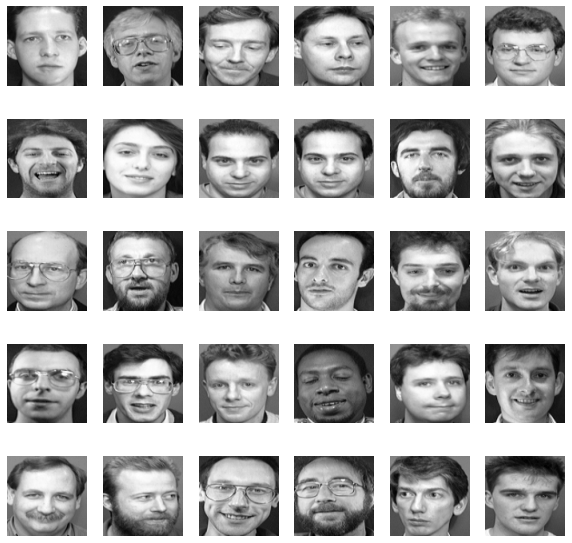

*************************************************************************
Classify Test


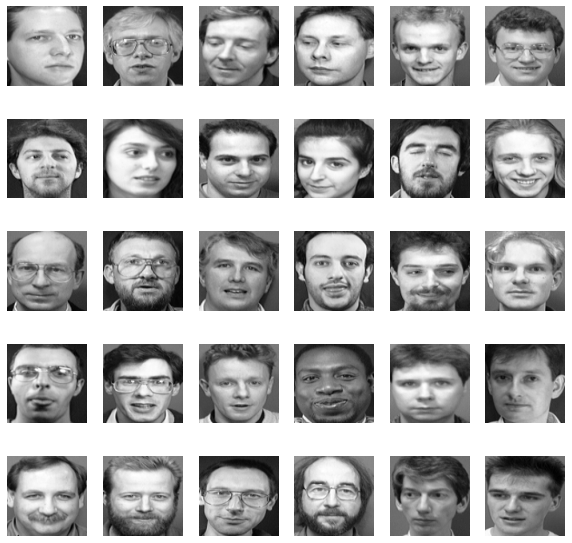

*************************************************************************
Detect Test


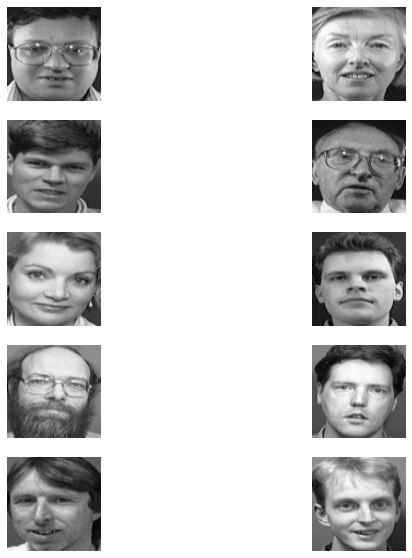

In [ ]:
print('Train Images')
griddisplay(image_train_list)
print('*************************************************************************')
print('Classify Test')
griddisplay(image_test_list)
print('*************************************************************************')
print('Detect Test')
griddisplay(image_detect_list)


# **Finding and Plotting Mean Face**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
    Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
  # This is added back by InteractiveShellApp.init_path()


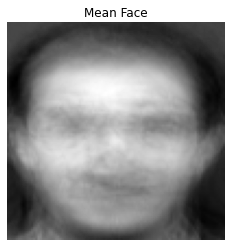

In [ ]:
flattened_images  =[]
for i in range(len(image_train_list)):
    p=image_train_list[i].flatten()
    flattened_images.append(p)
A_transpose = np.matrix(flattened_images)
A = np.transpose(A_transpose)

mean= np.mean(A,1)

b= mean.reshape(image_train_list[1].shape[0],image_train_list[1].shape[1])
resized_mean = scipy.misc.imresize(np.asarray(b),(100,100),interp='bilinear', mode=None)
imshow(resized_mean,cmap=plt.cm.gray)
plt.axis('off')
plt.title('Mean Face')
plt.show()

# **Finding and Plotting zero Mean Faces**

Zero mean faces


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
    Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
  if __name__ == '__main__':


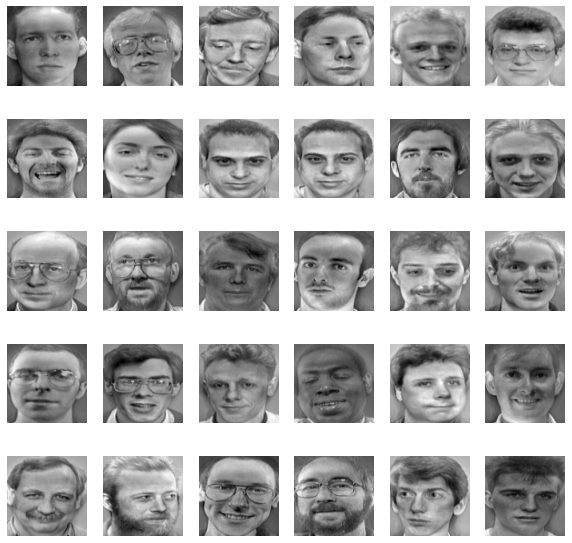

In [ ]:
zero_mean =[]
column =0
n,h,w=np.shape(image_train_list)
Zero_mean_matrix= np.ones((h*w,n))
for values in flattened_images:
    #zm = values-mean
    zm= A[:,column] - mean
    #print("z",zm.shape)
    zm = np.squeeze(zm)
    Zero_mean_matrix[:,column] =zm
    zm_images = zm.resize(h,w)
    zero_mean.append(zm)
    column = column +1
print('Zero mean faces')
griddisplay(zero_mean)

# **Finding and Plotting Eigenfaces**

eigrnfaces


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
    Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
  if __name__ == '__main__':


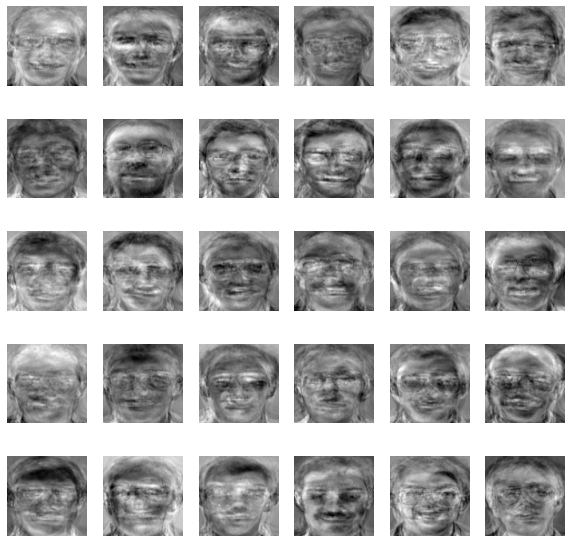

In [ ]:
d = (np.dot(np.transpose(Zero_mean_matrix),Zero_mean_matrix))/112
u_list =[]
w2, v2 = la.eigh(d)

for ev in v2:
    ev_transpose = np.transpose(np.matrix(ev))
    u = np.dot(Zero_mean_matrix,ev_transpose)
    #norms = np.linalg.norm(u, axis=0)                           
    u = u / np.linalg.norm(u)
    #     minu = np.min(u)
    #     maxu = np.max(u)
    #     u = u-float(minu)
    #     u = u/float((maxu-minu)) 
    u_i= u.reshape(112,92)
    u_list.append(u_i)

print('eigrnfaces')
griddisplay(u_list)

# **Reconstruction with help of Eigenfaces for M=2,5,15**

		k=2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
    Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
  if __name__ == '__main__':


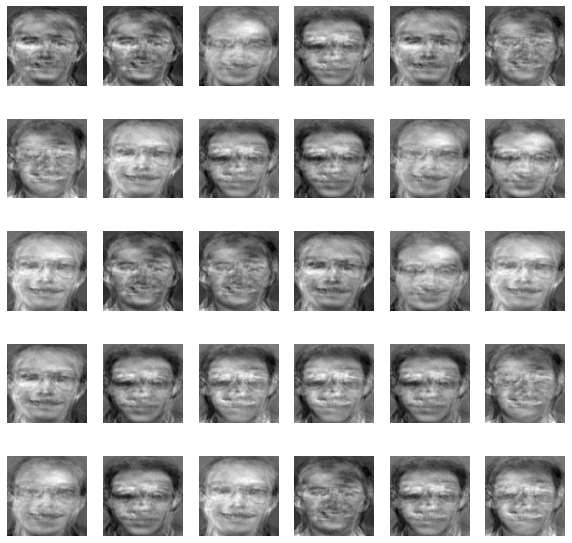

		k=5


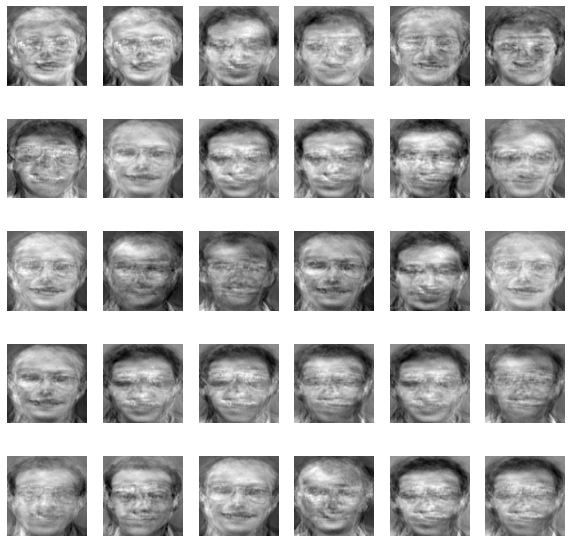

		k=15


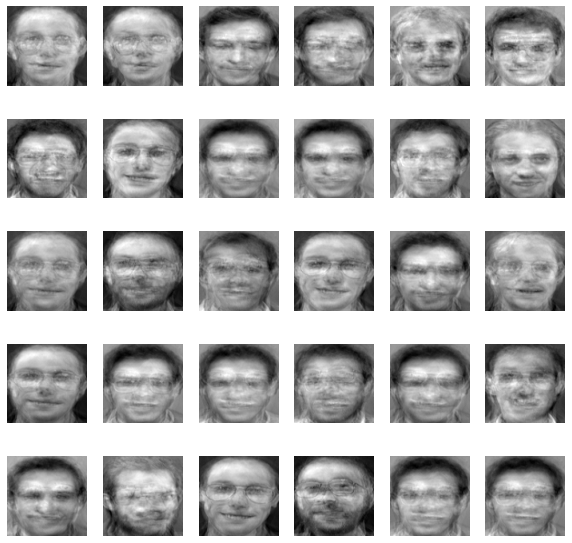

In [ ]:
dict ={}
def Reconstruct(k, boolean):
    weights=np.zeros((30,k))
    matrixU = np.zeros((112*92,k))
    c =0
    for val in range(k-1,-1,-1):
        matrixU[:,c] = u_list[val].flatten()
        c = c+1
    rec_face=[]
    for face_num in range(0,30):
        w = np.dot(np.transpose(matrixU) ,Zero_mean_matrix[:,face_num])
        #w = Zero_mean_matrix[:,face_num]*np.transpose(matrixU)  
        weights[face_num,:] =w
        #face=np.zeros((1, 180625))
        #         face = np.dot(w[0], matrixU[:,0])
        #         for i in range(1,k):
        #             face = face + np.dot(w[i], matrixU[:,i])
        #         #print(face.shape)
        #         face = face+np.transpose(mean)

        face = np.dot(w, np.transpose(matrixU))
        minf = np.min(face)
        maxf = np.max(face)
        face = face-float(minf)
        face = face/float((maxf-minf))
        face = face+np.transpose(mean)
        reshape_face = face.reshape(112,92)
        rec_face.append( reshape_face)
    if boolean is True:
        griddisplay(rec_face)
    dict[k] = weights

print('\t\tk=2')
Reconstruct(2,True)
print('\t\tk=5')
Reconstruct(5,True)
print('\t\tk=15')
Reconstruct(15,True)

# **Recognized and Unknown Faces for M=2,5,15**

In [ ]:
def Project(k,zero_mean_test,threshold):
    matrixU = np.zeros((112*92,k))
    rec=0
    c =0
    for val in range(k-1,-1,-1):
        matrixU[:,c] = u_list[val].flatten()
        c = c+1
    w = np.dot(np.transpose(matrixU) ,np.transpose(zero_mean_test))
    original_w_k =dict[k]
    dist =[]
    for wt_vectors in original_w_k:
        dist.append(np.linalg.norm(wt_vectors-w.T))

    nearest_face = np.argmin(dist)
    nearest_face_weights = original_w_k[nearest_face]
    fig1, axes_array = plt.subplots(1, 2)
    fig1.set_size_inches(3,3)
    zero_mean_test =zero_mean_test + np.transpose(mean)
    zero_mean_test = zero_mean_test.reshape(112,92)
    image_plot = axes_array[0].imshow(zero_mean_test,cmap=plt.cm.gray)
    axes_array[0].axis('off')
    axes_array[0].set(title='Test Face')

    face = np.dot(nearest_face_weights, np.transpose(matrixU))
    face = face+np.transpose(mean)
    reshape_face = face.reshape(112,92)
    if np.min(dist)<threshold:  #Nonface
        image_plot = axes_array[1].imshow(reshape_face,cmap=plt.cm.gray)
        rec=rec+1
    #else:
       # print('Unknown')
    axes_array[1].axis('off')
    axes_array[1].set(title='Recognized Face')
    plt.show()
    return rec

In [ ]:
def runs(k,th,img):
    rec=0
    for num in range(0,len(img)):#t in test_images:
        t = img[num]
        test = t.flatten()
        zero_mean_test = test-np.transpose(mean)
        r=Project(k,zero_mean_test,th)  #threshold =80
        rec=rec+r

    return rec

In [ ]:
test_=image_test_list+image_detect_list


**When threshold and M are small, there are a lot of images which can not be recognized.**

**M=2 and Threshold=1**

		k=2


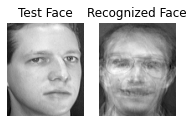

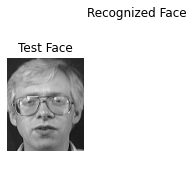

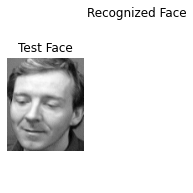

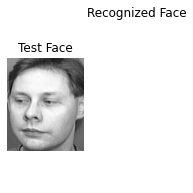

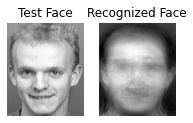

...

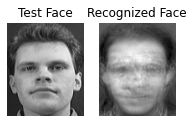

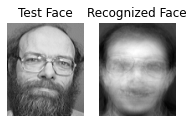

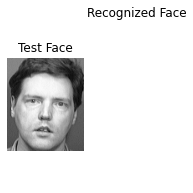

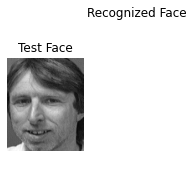

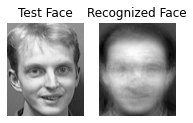

16


In [ ]:
print('\t\tk=2')
rec=runs(2,1,test_)
print(rec)


**M=5 and Threshold=80**

		k=5


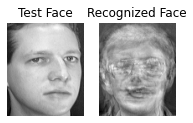

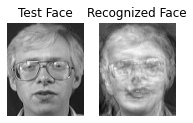

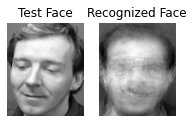

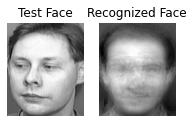

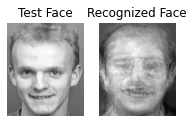

...

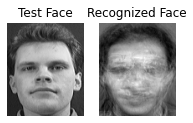

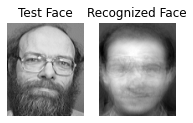

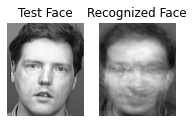

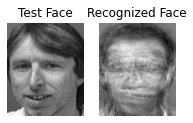

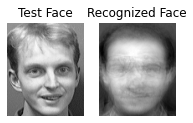

40


In [ ]:
print('\t\tk=5')
rec=runs(5,80,test_)
print(rec)


# **Percentage of correct Recognition for M=15 and different thresholds**

K=15
th=%d 1


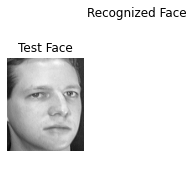

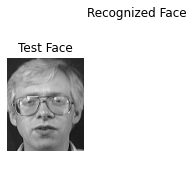

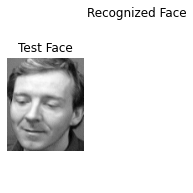

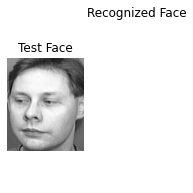

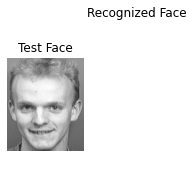

...

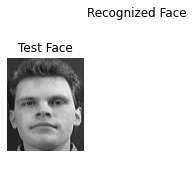

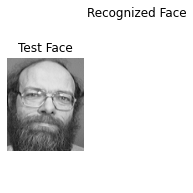

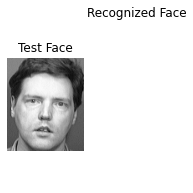

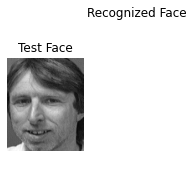

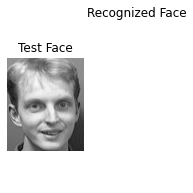

K=15
th=%d 5


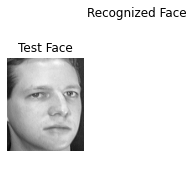

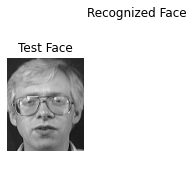

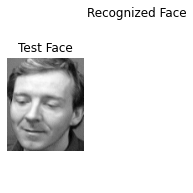

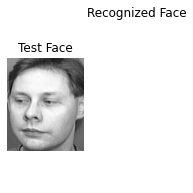

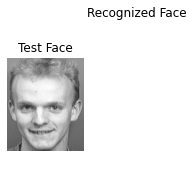

...

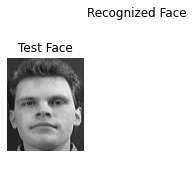

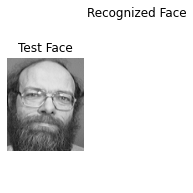

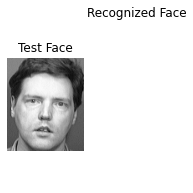

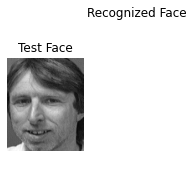

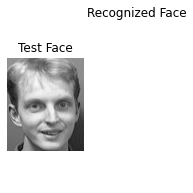

K=15
th=%d 10


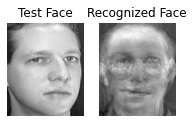

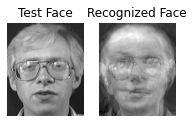

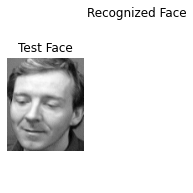

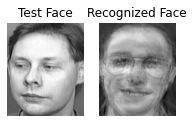

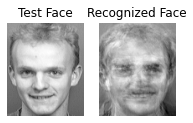

...

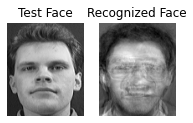

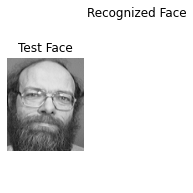

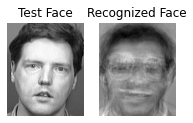

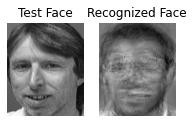

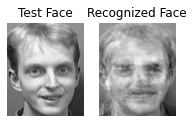

K=15
th=%d 15


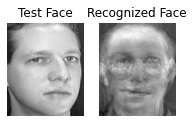

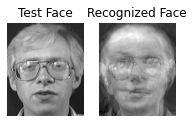

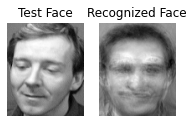

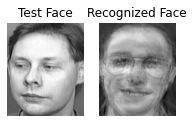

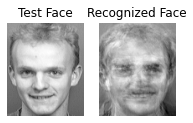

...

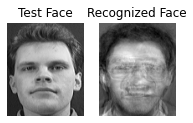

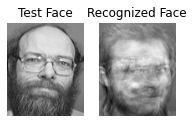

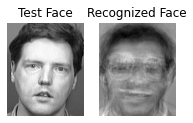

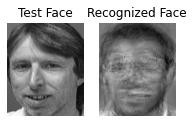

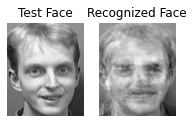

K=15
th=%d 20


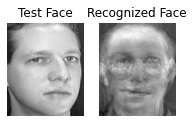

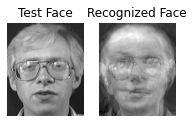

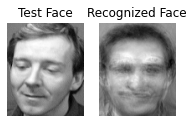

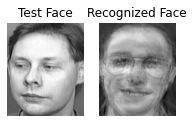

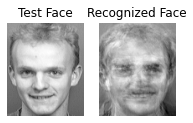

...

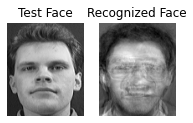

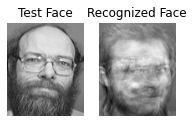

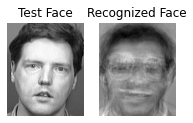

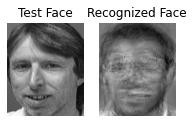

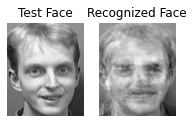

K=15
th=%d 40


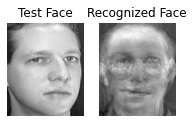

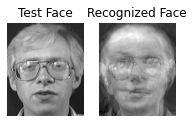

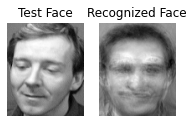

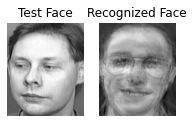

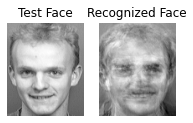

...

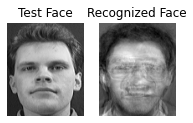

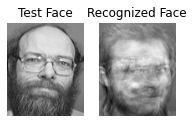

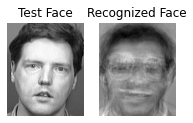

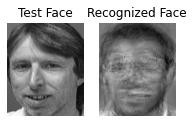

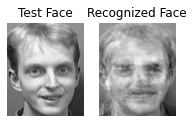

K=15
th=%d 50


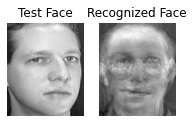

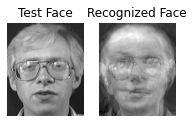

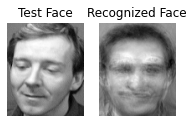

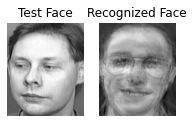

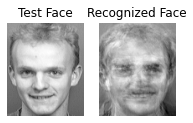

...

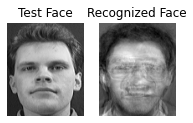

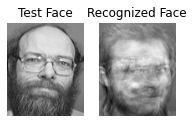

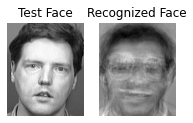

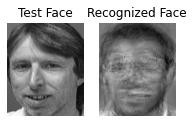

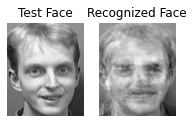

In [ ]:
th=[1,5,10,15,20,40,50]
prec=[]
for i in th:
  print("K=15")
  print("th=",i)
  rec=runs(15,i,test_)
  p=(rec/int(len(test_)))*100
  prec.append(p)


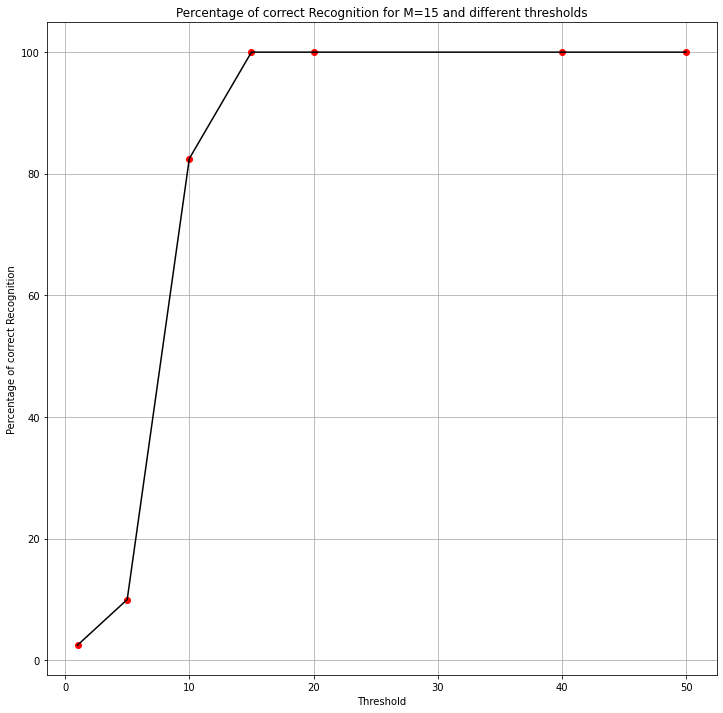

In [ ]:
plt.figure(figsize=(12,12))
plt.plot(th,prec,'ro',th,prec,'k')
plt.title('Percentage of correct Recognition for M=15 and different thresholds')
plt.xlabel('Threshold')
plt.ylabel('Percentage of correct Recognition')
plt.grid()


# **Percentage of correct Recognition for th=10 and different M**

K= 2
th=10


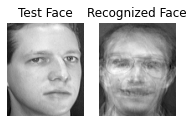

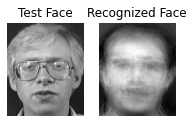

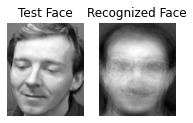

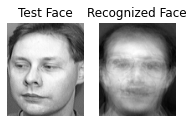

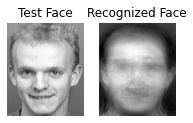

...

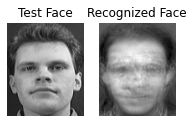

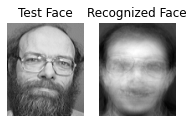

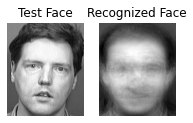

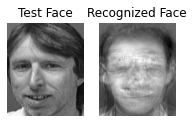

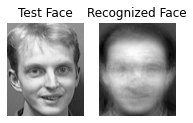

K= 4
th=10


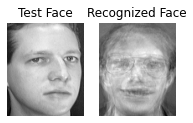

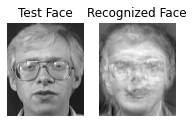

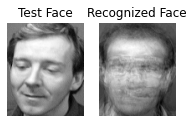

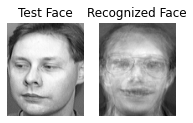

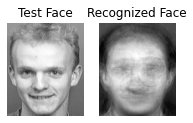

...

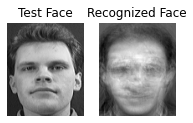

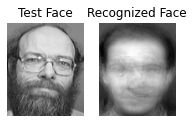

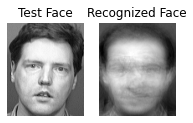

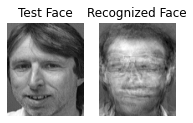

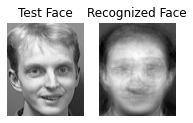

K= 6
th=10


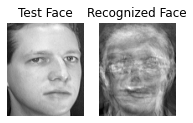

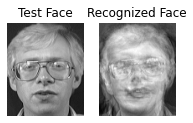

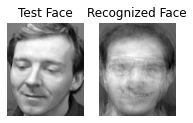

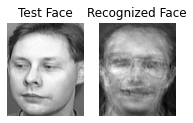

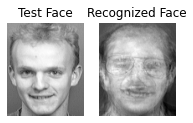

...

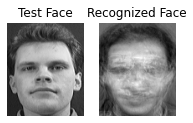

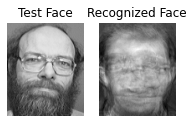

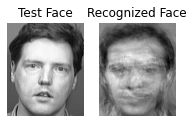

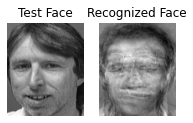

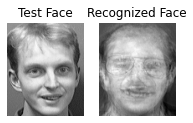

K= 8
th=10


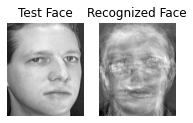

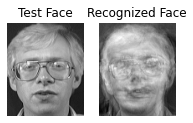

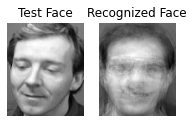

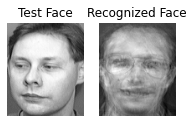

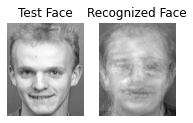

...

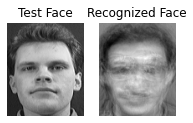

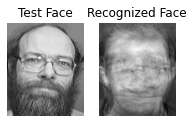

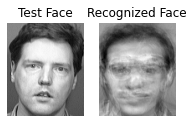

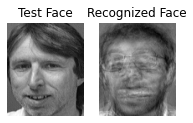

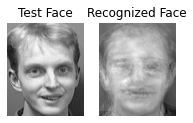

K= 10
th=10


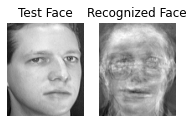

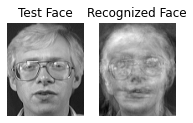

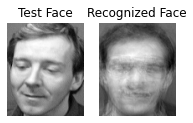

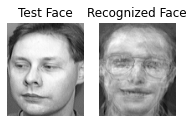

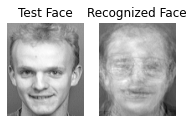

...

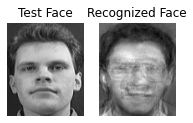

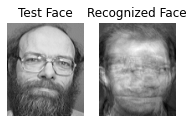

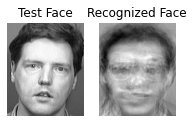

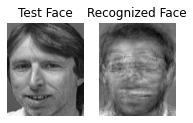

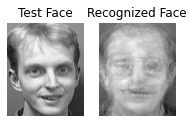

K= 16
th=10


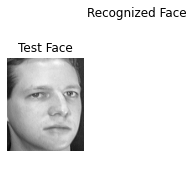

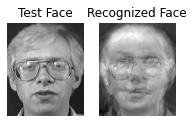

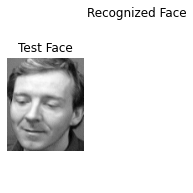

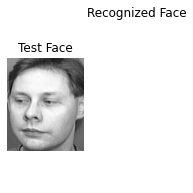

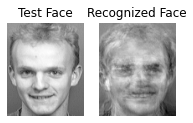

...

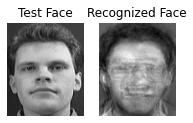

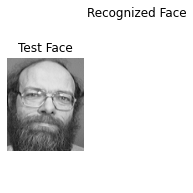

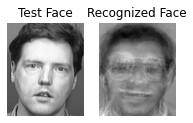

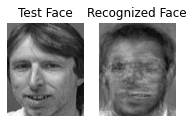

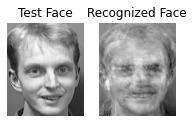

K= 20
th=10


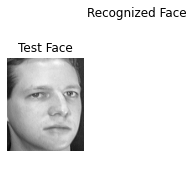

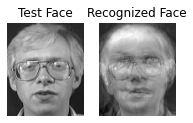

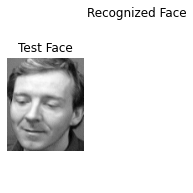

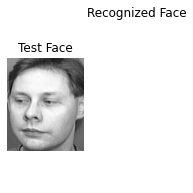

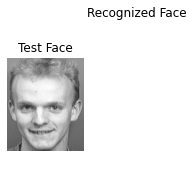

...

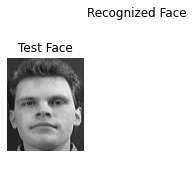

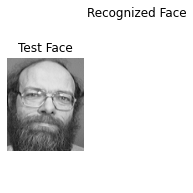

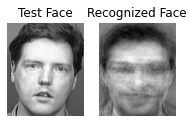

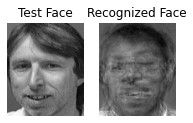

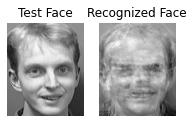

K= 24
th=10


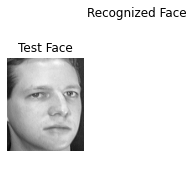

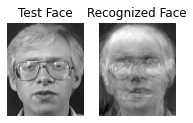

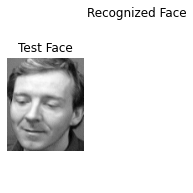

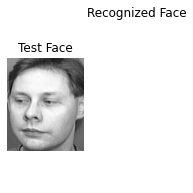

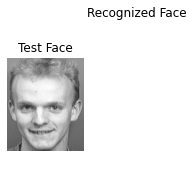

...

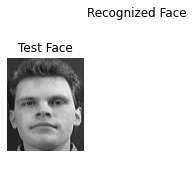

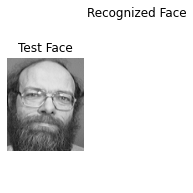

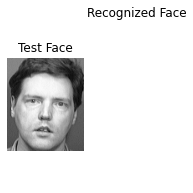

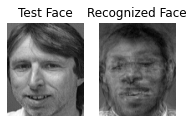

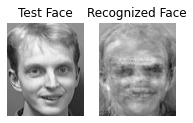

In [ ]:
M=[2,4,6,8,10,16,20,24]
prec=[]
for i in M:
  print("K=",i)
  print("th=10")
  rec=runs(i,10,test_)
  p=(rec/int(len(test_)))*100
  prec.append(p)

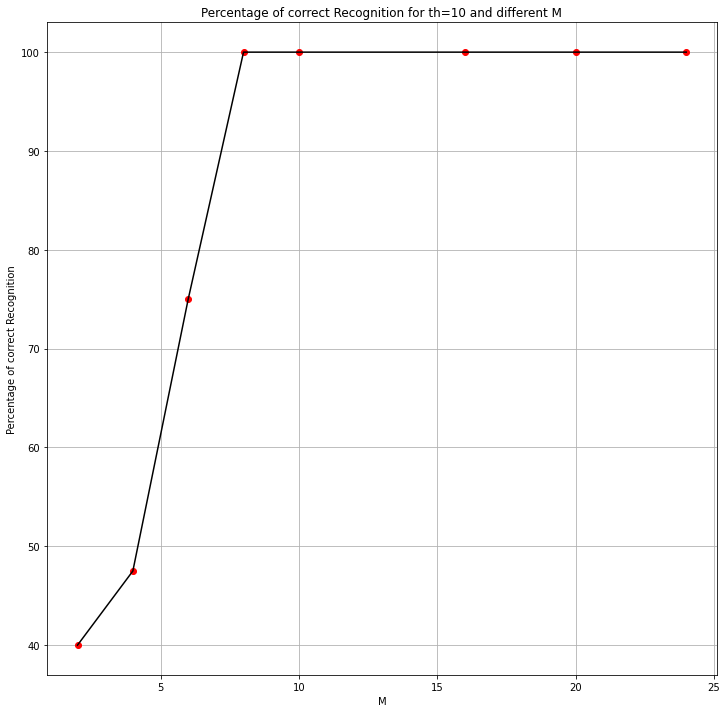

In [ ]:

plt.figure(figsize=(12,12))
plt.plot(M,prec,'ro',M,prec,'k')
plt.title('Percentage of correct Recognition for th=10 and different M')
plt.xlabel('M')
plt.ylabel('Percentage of correct Recognition')
plt.grid()

# **Non-Face**

In [ ]:
n_test=image_non_face_list+image_detect_list

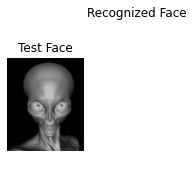

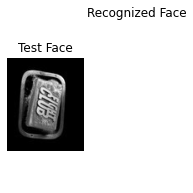

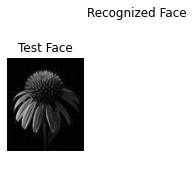

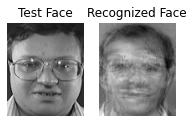

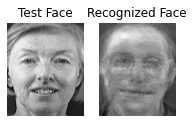

...

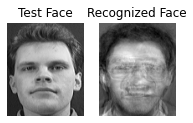

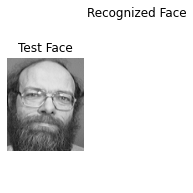

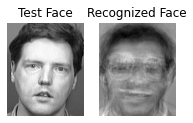

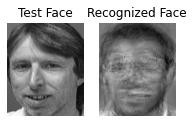

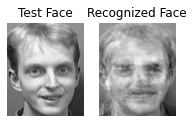

In [ ]:
rec=runs(15,10,n_test)

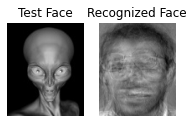

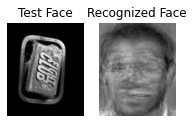

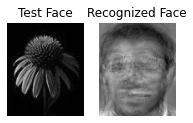

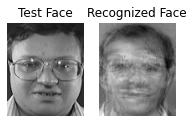

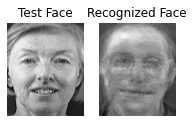

...

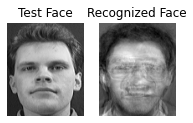

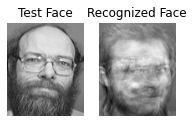

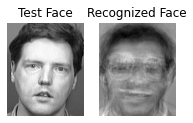

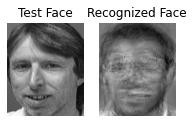

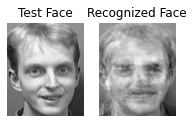

In [ ]:
rec=runs(15,80,n_test)